In [1]:
import os
os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID"   # see issue #152
os.environ["CUDA_VISIBLE_DEVICES"]="14"

import numpy as np
import tensorflow as tf
from   tensorflow import keras
from   tensorflow.keras import layers
import tensorflow_addons as tfa
from tensorflow.keras import Model, losses, optimizers
from tensorflow.keras.callbacks import Callback

import glob
import matplotlib.pyplot as plt

AUTOTUNE = tf.data.experimental.AUTOTUNE


2023-11-23 22:07:37.945824: I tensorflow/core/platform/cpu_feature_guard.cc:194] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE3 SSE4.1 SSE4.2 AVX
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [2]:
BUFFER_SIZE = 1000
BATCH_SIZE =  4
EPOCHS_NUM = 20
IMG_WIDTH = 256
IMG_HEIGHT = 256


In [3]:
MONET_IMAGES_PATH = '../mp/monet/JPEGImages/'
PHOTO_IMAGES_PATH = '../mp/photo/photo_jpg/'

monet_image_files = sorted(glob.glob(MONET_IMAGES_PATH + '*.jpg'))
photo_image_files = sorted(glob.glob(PHOTO_IMAGES_PATH + '*.jpg'))

print('Number of Monet images:', len(monet_image_files))
print('Number of Photo images:', len(photo_image_files))


Number of Monet images: 300
Number of Photo images: 7038


In [4]:
def load_image(file_path):
    image = tf.io.read_file(file_path)
    image = tf.image.decode_png(image, channels=3)  # or decode_png for PNG images
    image = (tf.cast(image, tf.float32) / 127.5) - 1        
    image = tf.reshape(image, [IMG_HEIGHT, IMG_WIDTH, 3])             
    return image

def create_dataset_from_folder(folder_path, ext='png'):
    dataset = tf.data.Dataset.list_files(folder_path + '*.' + ext)
    dataset = dataset.map(load_image)
    return dataset.prefetch(tf.data.AUTOTUNE)


In [5]:
monet_ds = create_dataset_from_folder(MONET_IMAGES_PATH, 'jpg')
monet_ds = monet_ds.batch(BATCH_SIZE, drop_remainder=True)

photo_ds = create_dataset_from_folder(PHOTO_IMAGES_PATH, 'jpg')
photo_ds = photo_ds.batch(BATCH_SIZE, drop_remainder=True)

2023-11-23 22:07:42.115535: I tensorflow/core/platform/cpu_feature_guard.cc:194] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE3 SSE4.1 SSE4.2 AVX
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-11-23 22:07:42.467636: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1637] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 31137 MB memory:  -> device: 0, name: Tesla V100-SXM3-32GB, pci bus id: 0000:e5:00.0, compute capability: 7.0


In [6]:
def data_augment(image):
    num_channels = image.shape[-1]

    p_rotate = tf.random.uniform([], 0, 1.0, dtype=tf.float32)
    p_spatial = tf.random.uniform([], 0, 1.0, dtype=tf.float32)
    p_crop = tf.random.uniform([], 0, 1.0, dtype=tf.float32)

    # Jittering
    if p_crop > .5:
        image = tf.image.resize(image, [286, 286])
        image = tf.image.random_crop(image, size=[256, 256, num_channels])
        if p_crop > .9:
            image = tf.image.resize(image, [300, 300])
            image = tf.image.random_crop(image, size=[256, 256, num_channels])
    
    # Mirroring
    if p_spatial > .6:
        image = tf.image.random_flip_left_right(image)

    return image


In [7]:
def get_gan_dataset(monet_folder, photo_folder, augment=None, repeat=True, shuffle=True, batch_size=1):

    monet_ds = create_dataset_from_folder(monet_folder, 'jpg')
    photo_ds = create_dataset_from_folder(photo_folder, 'jpg')
    
    if augment:
        monet_ds = monet_ds.map(augment, num_parallel_calls=AUTOTUNE)
        photo_ds = photo_ds.map(augment, num_parallel_calls=AUTOTUNE)

    if repeat:
        monet_ds = monet_ds.repeat()
        photo_ds = photo_ds.repeat()
        
    if shuffle:
        monet_ds = monet_ds.shuffle(2048)
        photo_ds = photo_ds.shuffle(2048)
        
    monet_ds = monet_ds.batch(batch_size, drop_remainder=True)
    photo_ds = photo_ds.batch(batch_size, drop_remainder=True)
    monet_ds = monet_ds.prefetch(AUTOTUNE)
    photo_ds = photo_ds.prefetch(AUTOTUNE)
    
    gan_ds = tf.data.Dataset.zip((monet_ds, photo_ds))
    
    return gan_ds


In [8]:
full_dataset = get_gan_dataset(MONET_IMAGES_PATH, 
                               PHOTO_IMAGES_PATH, 
                               augment=data_augment, 
                               repeat=True, 
                               shuffle=False, 
                               batch_size=BATCH_SIZE)


In [9]:
example_monet, example_photo = next(iter(full_dataset))

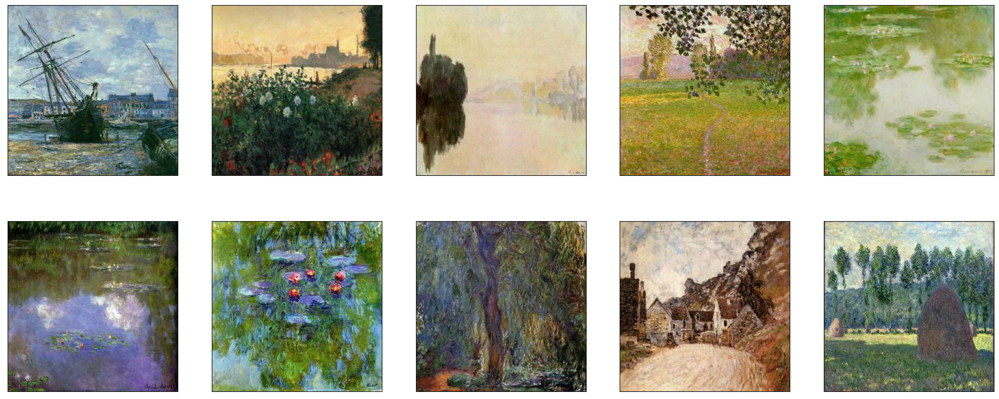

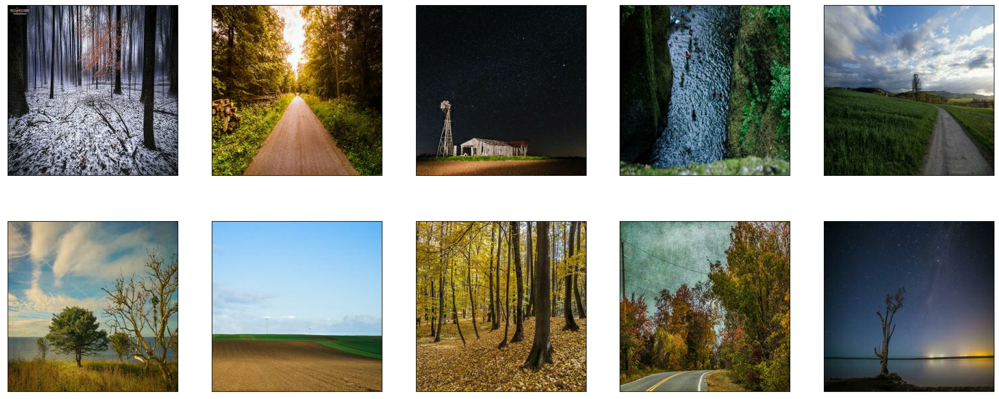

In [10]:
def view_image(ds, nrows=1, ncols=5):
    ds_iter = iter(ds)
    # image = next(iter(ds)) # extract 1 from the dataset
    # image = image.numpy()  # convert the image tensor to NumPy ndarrays.

    fig = plt.figure(figsize=(25, nrows * 5.05 )) # figsize with Width, Height
    
    # loop thru all the images (number of rows * number of columns)
    for i in range(ncols * nrows):
        image = next(ds_iter)
        image = image.numpy()
        ax = fig.add_subplot(nrows, ncols, i+1, xticks=[], yticks=[])
        ax.imshow(image[0] * 0.5 + .5) # rescale the data in [0, 1] for display
        
view_image(monet_ds, 2, 5)
view_image(photo_ds, 2, 5)


## Model

In [11]:
OUTPUT_CHANNELS = 3

def downsample(filters, size, apply_instancenorm=True):
    initializer = tf.random_normal_initializer(0., 0.02)
    gamma_init = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)

    result = keras.Sequential()
    result.add(layers.Conv2D(filters, size, strides=2, padding='same',
                             kernel_initializer=initializer, use_bias=False))

    if apply_instancenorm:
        result.add(tfa.layers.InstanceNormalization(gamma_initializer=gamma_init))

    result.add(layers.LeakyReLU())

    return result


def upsample(filters, size, apply_dropout=False):
    initializer = tf.random_normal_initializer(0., 0.02)
    gamma_init = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)

    result = keras.Sequential()
    result.add(layers.Conv2DTranspose(filters, size, strides=2,
                                      padding='same',
                                      kernel_initializer=initializer,
                                      use_bias=False))

    result.add(tfa.layers.InstanceNormalization(gamma_initializer=gamma_init))

    if apply_dropout:
        result.add(layers.Dropout(0.5))

    result.add(layers.ReLU())

    return result


In [12]:
def Generator():
    inputs = layers.Input(shape=[256,256,3])

    # bs = batch size
    down_stack = [
        downsample(64, 4, apply_instancenorm=False), # (bs, 128, 128, 64)
        downsample(128, 4), # (bs, 64, 64, 128)
        downsample(256, 4), # (bs, 32, 32, 256)
        downsample(512, 4), # (bs, 16, 16, 512)
        downsample(512, 4), # (bs, 8, 8, 512)
        downsample(512, 4), # (bs, 4, 4, 512)
        downsample(512, 4), # (bs, 2, 2, 512)
        downsample(512, 4), # (bs, 1, 1, 512)
    ]

    up_stack = [
        upsample(512, 4, apply_dropout=True), # (bs, 2, 2, 1024)
        upsample(512, 4, apply_dropout=True), # (bs, 4, 4, 1024)
        upsample(512, 4, apply_dropout=True), # (bs, 8, 8, 1024)
        upsample(512, 4), # (bs, 16, 16, 1024)
        upsample(256, 4), # (bs, 32, 32, 512)
        upsample(128, 4), # (bs, 64, 64, 256)
        upsample(64, 4), # (bs, 128, 128, 128)
    ]

    initializer = tf.random_normal_initializer(0., 0.02)
    last = layers.Conv2DTranspose(OUTPUT_CHANNELS, 4,
                                  strides=2,
                                  padding='same',
                                  kernel_initializer=initializer,
                                  activation='tanh') # (bs, 256, 256, 3)

    x = inputs

    # Downsampling through the model
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)

    skips = reversed(skips[:-1])

    # Upsampling and establishing the skip connections
    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = layers.Concatenate()([x, skip])

    x = last(x)

    return keras.Model(inputs=inputs, outputs=x)


In [13]:
def Discriminator():
    initializer = tf.random_normal_initializer(0., 0.02)
    gamma_init = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)

    inp = layers.Input(shape=[256, 256, 3], name='input_image')

    x = inp

    down1 = downsample(64, 4, False)(x) # (bs, 128, 128, 64)
    down2 = downsample(128, 4)(down1) # (bs, 64, 64, 128)
    down3 = downsample(256, 4)(down2) # (bs, 32, 32, 256)

    zero_pad1 = layers.ZeroPadding2D()(down3) # (bs, 34, 34, 256)
    conv = layers.Conv2D(512, 4, strides=1,
                         kernel_initializer=initializer,
                         use_bias=False)(zero_pad1) # (bs, 31, 31, 512)

    norm1 = tfa.layers.InstanceNormalization(gamma_initializer=gamma_init)(conv)

    leaky_relu = layers.LeakyReLU()(norm1)

    zero_pad2 = layers.ZeroPadding2D()(leaky_relu) # (bs, 33, 33, 512)

    last = layers.Conv2D(1, 4, strides=1,
                         kernel_initializer=initializer)(zero_pad2) # (bs, 30, 30, 1)

    return tf.keras.Model(inputs=inp, outputs=last)


In [14]:
monet_generator = Generator()
photo_generator = Generator()

monet_discriminator = Discriminator()
photo_discriminator = Discriminator()


2023-11-23 22:07:49.781222: I tensorflow/stream_executor/cuda/cuda_dnn.cc:424] Loaded cuDNN version 8700


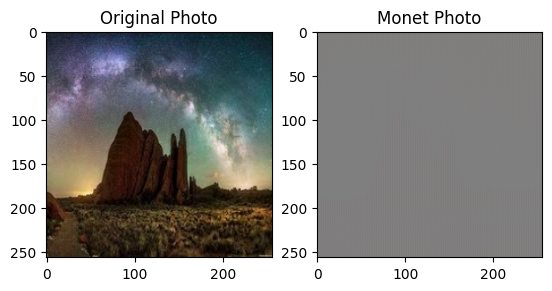

In [15]:
to_monet = monet_generator(example_photo)

plt.subplot(1, 2, 1)
plt.title("Original Photo")
plt.imshow(example_photo[0] * 0.5 + 0.5)

plt.subplot(1, 2, 2)
plt.title("Monet Photo")
plt.imshow(to_monet[0] * 0.5 + 0.5)
plt.show()


In [16]:
class CycleGan(keras.Model):
    def __init__(
        self,
        monet_generator,
        photo_generator,
        monet_discriminator,
        photo_discriminator,
        lambda_cycle=10,
    ):
        super(CycleGan, self).__init__()
        self.m_gen = monet_generator
        self.p_gen = photo_generator
        self.m_disc = monet_discriminator
        self.p_disc = photo_discriminator
        self.lambda_cycle = lambda_cycle
        
    def compile(
        self,
        m_gen_optimizer,
        p_gen_optimizer,
        m_disc_optimizer,
        p_disc_optimizer,
        gen_loss_fn,
        disc_loss_fn,
        cycle_loss_fn,
        identity_loss_fn
    ):
        super(CycleGan, self).compile()
        self.m_gen_optimizer = m_gen_optimizer
        self.p_gen_optimizer = p_gen_optimizer
        self.m_disc_optimizer = m_disc_optimizer
        self.p_disc_optimizer = p_disc_optimizer
        self.gen_loss_fn = gen_loss_fn
        self.disc_loss_fn = disc_loss_fn
        self.cycle_loss_fn = cycle_loss_fn
        self.identity_loss_fn = identity_loss_fn
        
    def train_step(self, batch_data):
        real_monet, real_photo = batch_data
        
        with tf.GradientTape(persistent=True) as tape:
            # photo to monet back to photo
            fake_monet = self.m_gen(real_photo, training=True)
            cycled_photo = self.p_gen(fake_monet, training=True)

            # monet to photo back to monet
            fake_photo = self.p_gen(real_monet, training=True)
            cycled_monet = self.m_gen(fake_photo, training=True)

            # generating itself
            same_monet = self.m_gen(real_monet, training=True)
            same_photo = self.p_gen(real_photo, training=True)

            # discriminator used to check, inputing real images
            disc_real_monet = self.m_disc(real_monet, training=True)
            disc_real_photo = self.p_disc(real_photo, training=True)

            # discriminator used to check, inputing fake images
            disc_fake_monet = self.m_disc(fake_monet, training=True)
            disc_fake_photo = self.p_disc(fake_photo, training=True)

            # evaluates generator loss
            monet_gen_loss = self.gen_loss_fn(disc_fake_monet)
            photo_gen_loss = self.gen_loss_fn(disc_fake_photo)

            # evaluates total cycle consistency loss
            total_cycle_loss = self.cycle_loss_fn(real_monet, cycled_monet, self.lambda_cycle) + self.cycle_loss_fn(real_photo, cycled_photo, self.lambda_cycle)

            # evaluates total generator loss
            total_monet_gen_loss = monet_gen_loss + total_cycle_loss + self.identity_loss_fn(real_monet, same_monet, self.lambda_cycle)
            total_photo_gen_loss = photo_gen_loss + total_cycle_loss + self.identity_loss_fn(real_photo, same_photo, self.lambda_cycle)

            # evaluates discriminator loss
            monet_disc_loss = self.disc_loss_fn(disc_real_monet, disc_fake_monet)
            photo_disc_loss = self.disc_loss_fn(disc_real_photo, disc_fake_photo)

        # Calculate the gradients for generator and discriminator
        monet_generator_gradients = tape.gradient(total_monet_gen_loss,
                                                  self.m_gen.trainable_variables)
        photo_generator_gradients = tape.gradient(total_photo_gen_loss,
                                                  self.p_gen.trainable_variables)

        monet_discriminator_gradients = tape.gradient(monet_disc_loss,
                                                      self.m_disc.trainable_variables)
        photo_discriminator_gradients = tape.gradient(photo_disc_loss,
                                                      self.p_disc.trainable_variables)

        # Apply the gradients to the optimizer
        self.m_gen_optimizer.apply_gradients(zip(monet_generator_gradients,
                                                 self.m_gen.trainable_variables))

        self.p_gen_optimizer.apply_gradients(zip(photo_generator_gradients,
                                                 self.p_gen.trainable_variables))

        self.m_disc_optimizer.apply_gradients(zip(monet_discriminator_gradients,
                                                  self.m_disc.trainable_variables))

        self.p_disc_optimizer.apply_gradients(zip(photo_discriminator_gradients,
                                                  self.p_disc.trainable_variables))
        
        return {
            "monet_gen_loss": total_monet_gen_loss,
            "photo_gen_loss": total_photo_gen_loss,
            "monet_disc_loss": monet_disc_loss,
            "photo_disc_loss": photo_disc_loss
        }


In [17]:
# Discriminator loss {0: fake, 1: real} (The discriminator loss outputs the average of the real and generated loss)
def discriminator_loss(real, generated):
    real_loss = losses.BinaryCrossentropy(from_logits=True, reduction=losses.Reduction.NONE)(tf.ones_like(real), real)
    generated_loss = losses.BinaryCrossentropy(from_logits=True, reduction=losses.Reduction.NONE)(tf.zeros_like(generated), generated)
    total_disc_loss = real_loss + generated_loss
    return total_disc_loss * 0.5
    
# Generator loss
def generator_loss(generated):
    return losses.BinaryCrossentropy(from_logits=True, reduction=losses.Reduction.NONE)(tf.ones_like(generated), generated)
    
# Cycle consistency loss (measures if original photo and the twice transformed photo to be similar to one another)
def calc_cycle_loss(real_image, cycled_image, LAMBDA):
    loss1 = tf.reduce_mean(tf.abs(real_image - cycled_image))
    return LAMBDA * loss1

# Identity loss (compares the image with its generator (i.e. photo with photo generator))
def identity_loss(real_image, same_image, LAMBDA):
    loss = tf.reduce_mean(tf.abs(real_image - same_image))
    return LAMBDA * 0.5 * loss


In [18]:
monet_generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
photo_generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

monet_discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
photo_discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)


In [19]:
cycle_gan_model = CycleGan(
    monet_generator, photo_generator, 
    monet_discriminator, photo_discriminator
)

cycle_gan_model.compile(
    m_gen_optimizer = monet_generator_optimizer,
    p_gen_optimizer = monet_generator_optimizer,
    m_disc_optimizer = monet_discriminator_optimizer,
    p_disc_optimizer = monet_discriminator_optimizer,
    gen_loss_fn = generator_loss,
    disc_loss_fn = discriminator_loss,
    cycle_loss_fn = calc_cycle_loss,
    identity_loss_fn = identity_loss
)

In [20]:
class GANMonitor(keras.callbacks.Callback):
    """A callback to generate and save images after each epoch"""

    def __init__(self, num_img=4):
        self.num_img = num_img

    def on_epoch_end(self, epoch, logs=None):
        _, ax = plt.subplots(4, 2, figsize=(12, 12))
        for i, img in enumerate(photo_ds.take(self.num_img)):
            prediction = self.model.m_gen(img)[0].numpy()
            prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
            img = (img[0] * 127.5 + 127.5).numpy().astype(np.uint8)

            ax[i, 0].imshow(img)
            ax[i, 1].imshow(prediction)
            ax[i, 0].set_title("Input image")
            ax[i, 1].set_title("Translated image")
            ax[i, 0].axis("off")
            ax[i, 1].axis("off")

        plt.show()
        plt.close()

plotter = GANMonitor()
checkpoint_filepath = "./rgb_model_checkpoints/cyclegan_checkpoints.{epoch:03d}"
model_checkpoint_callback = keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_filepath, save_weights_only=True
)


Epoch 1/20
1759/1759 [==============================] - ETA: 0s - monet_gen_loss: 3.2330 - photo_gen_loss: 3.3297 - monet_disc_loss: 0.6212 - photo_disc_loss: 0.6022

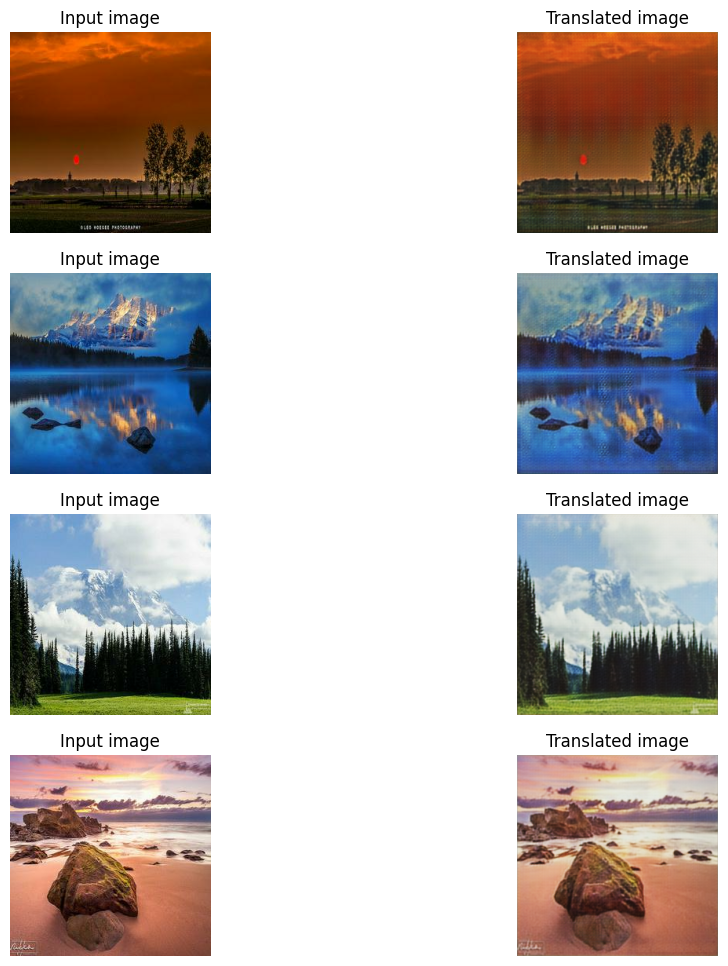

1759/1759 [==============================] - 572s 307ms/step - monet_gen_loss: 3.2325 - photo_gen_loss: 3.3295 - monet_disc_loss: 0.6213 - photo_disc_loss: 0.6022
Epoch 2/20
1759/1759 [==============================] - ETA: 0s - monet_gen_loss: 2.5332 - photo_gen_loss: 2.6178 - monet_disc_loss: 0.6230 - photo_disc_loss: 0.6098

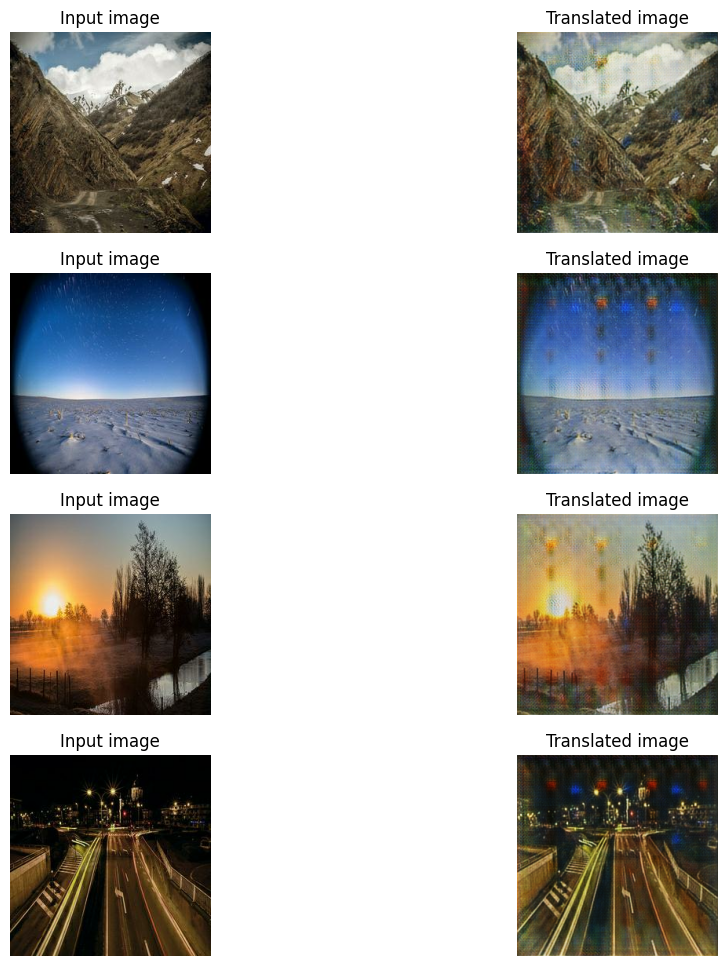

1759/1759 [==============================] - 539s 306ms/step - monet_gen_loss: 2.5333 - photo_gen_loss: 2.6177 - monet_disc_loss: 0.6229 - photo_disc_loss: 0.6097
Epoch 3/20
1759/1759 [==============================] - ETA: 0s - monet_gen_loss: 2.3391 - photo_gen_loss: 2.4526 - monet_disc_loss: 0.6372 - photo_disc_loss: 0.6191

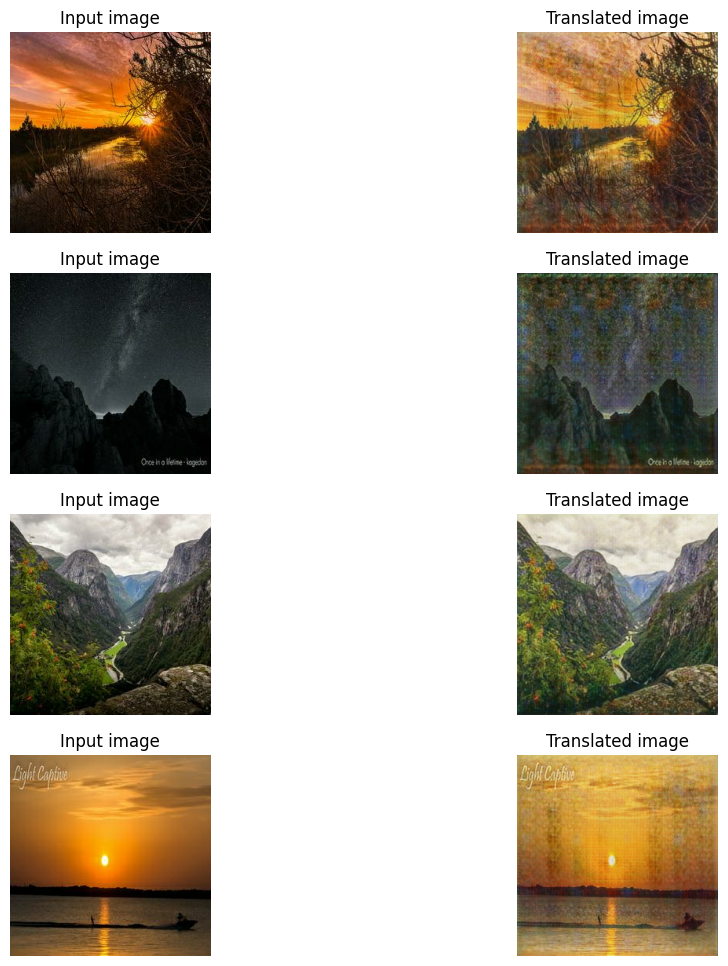

1759/1759 [==============================] - 539s 306ms/step - monet_gen_loss: 2.3392 - photo_gen_loss: 2.4526 - monet_disc_loss: 0.6373 - photo_disc_loss: 0.6191
Epoch 4/20
1759/1759 [==============================] - ETA: 0s - monet_gen_loss: 2.2761 - photo_gen_loss: 2.4384 - monet_disc_loss: 0.6373 - photo_disc_loss: 0.6027

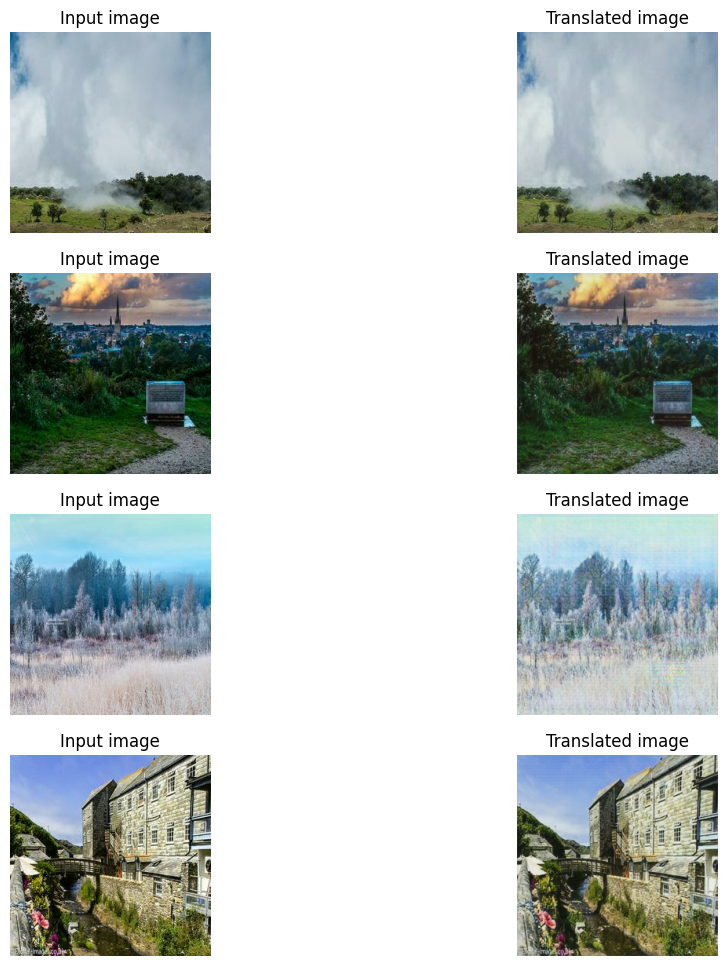

1759/1759 [==============================] - 539s 306ms/step - monet_gen_loss: 2.2759 - photo_gen_loss: 2.4385 - monet_disc_loss: 0.6374 - photo_disc_loss: 0.6028
Epoch 5/20
1759/1759 [==============================] - ETA: 0s - monet_gen_loss: 2.2620 - photo_gen_loss: 2.4001 - monet_disc_loss: 0.6289 - photo_disc_loss: 0.6020

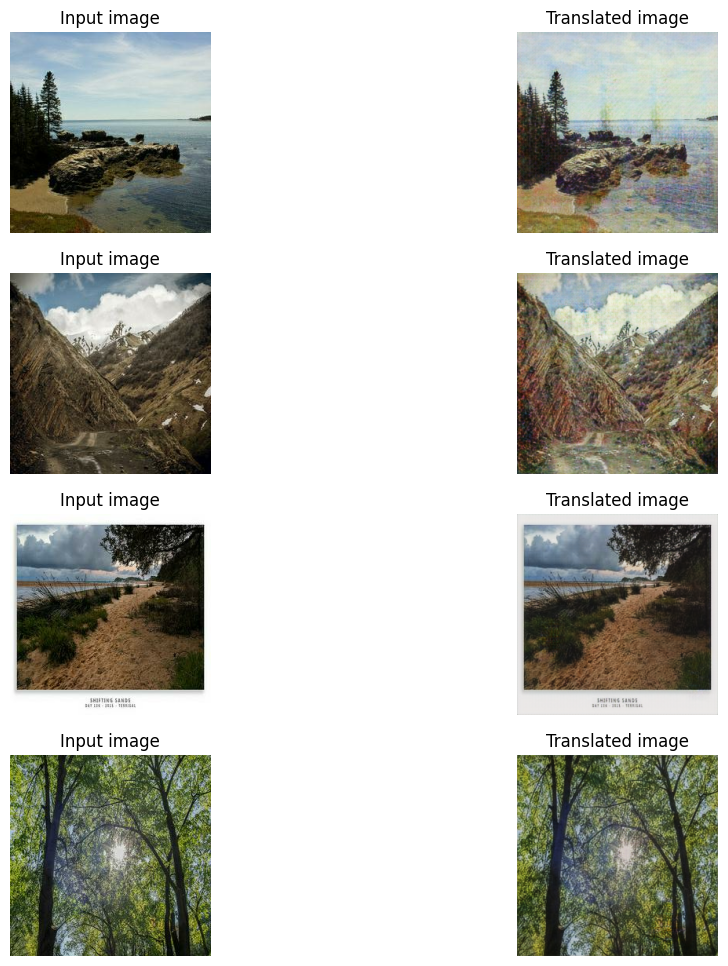

1759/1759 [==============================] - 539s 306ms/step - monet_gen_loss: 2.2617 - photo_gen_loss: 2.4001 - monet_disc_loss: 0.6289 - photo_disc_loss: 0.6020
Epoch 6/20
1759/1759 [==============================] - ETA: 0s - monet_gen_loss: 2.2749 - photo_gen_loss: 2.4477 - monet_disc_loss: 0.6239 - photo_disc_loss: 0.5847

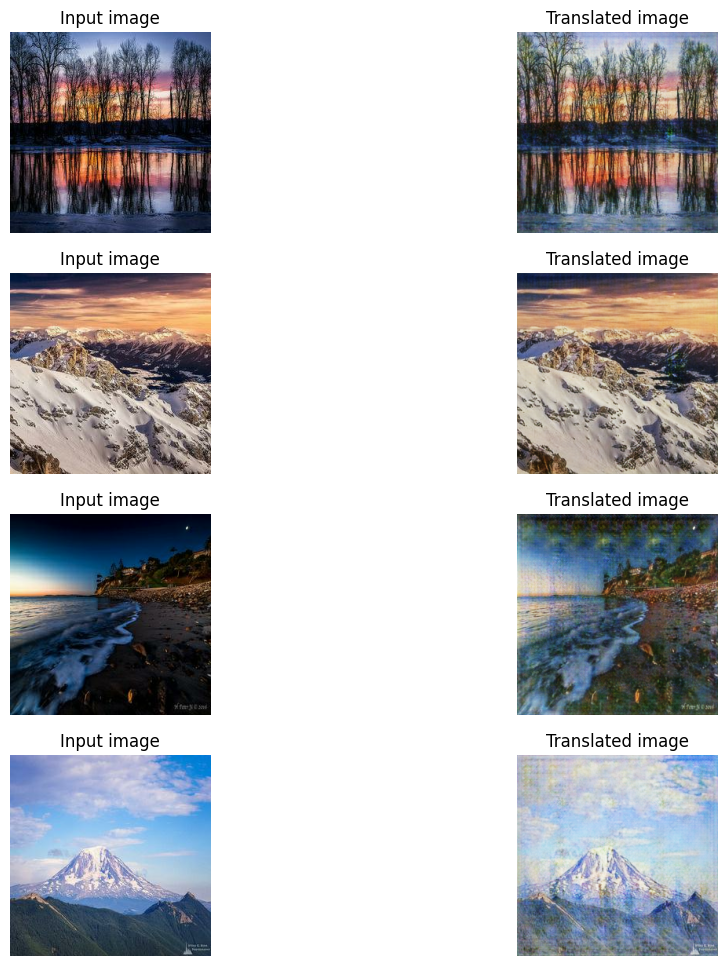

1759/1759 [==============================] - 538s 306ms/step - monet_gen_loss: 2.2750 - photo_gen_loss: 2.4476 - monet_disc_loss: 0.6239 - photo_disc_loss: 0.5847
Epoch 7/20
1759/1759 [==============================] - ETA: 0s - monet_gen_loss: 2.2895 - photo_gen_loss: 2.4083 - monet_disc_loss: 0.6119 - photo_disc_loss: 0.5914

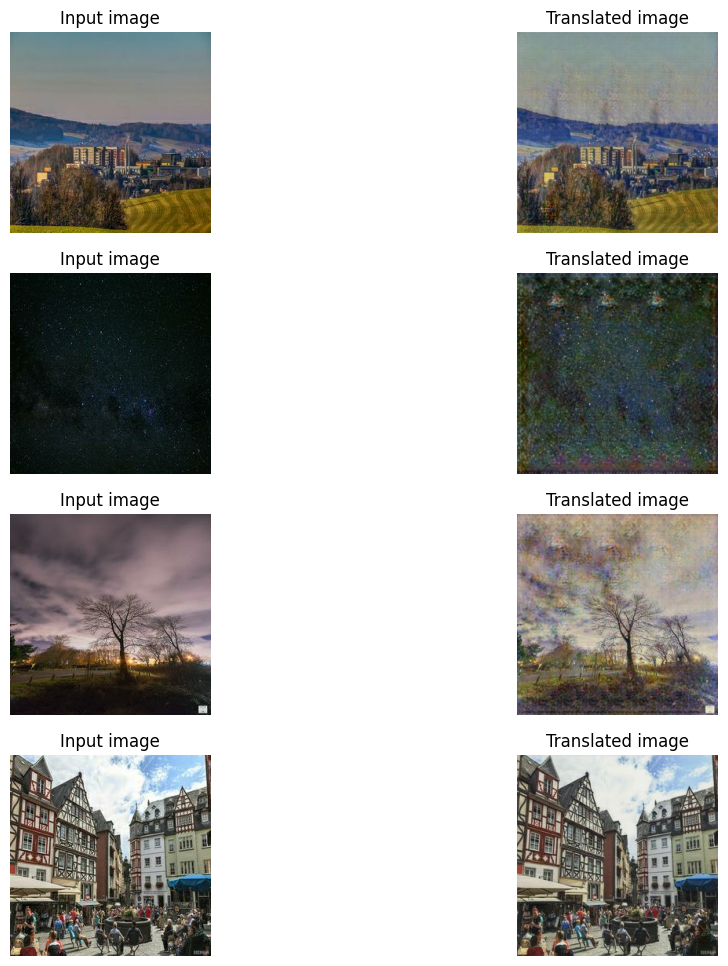

1759/1759 [==============================] - 538s 306ms/step - monet_gen_loss: 2.2896 - photo_gen_loss: 2.4082 - monet_disc_loss: 0.6118 - photo_disc_loss: 0.5914
Epoch 8/20
1759/1759 [==============================] - ETA: 0s - monet_gen_loss: 2.3226 - photo_gen_loss: 2.3994 - monet_disc_loss: 0.6016 - photo_disc_loss: 0.5943

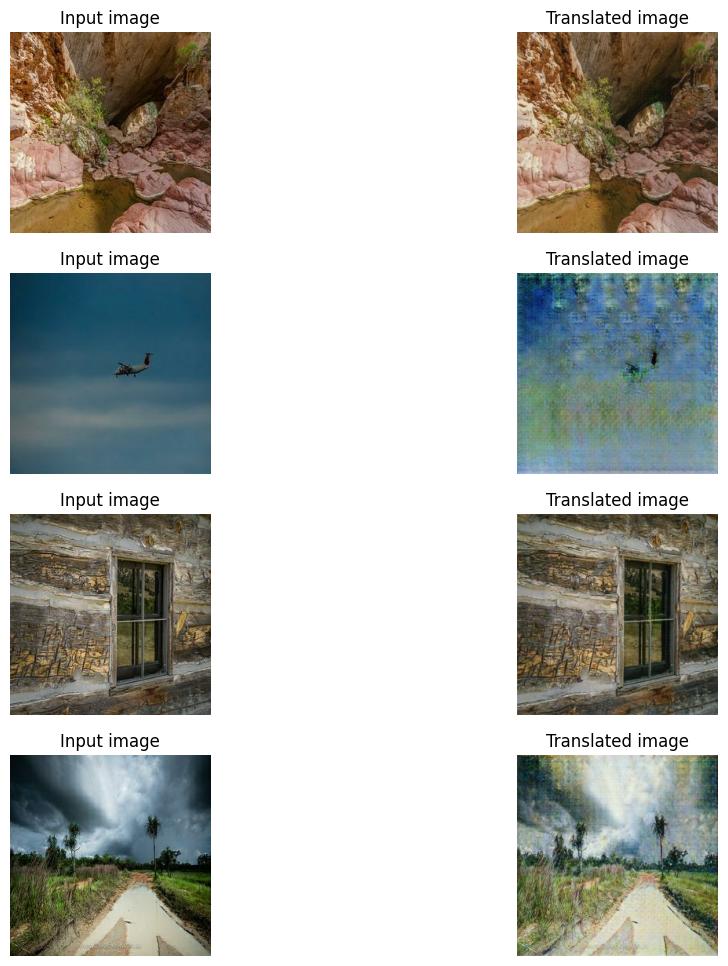

1759/1759 [==============================] - 537s 305ms/step - monet_gen_loss: 2.3229 - photo_gen_loss: 2.3995 - monet_disc_loss: 0.6016 - photo_disc_loss: 0.5942
Epoch 9/20
1759/1759 [==============================] - ETA: 0s - monet_gen_loss: 2.3580 - photo_gen_loss: 2.3934 - monet_disc_loss: 0.5911 - photo_disc_loss: 0.5928

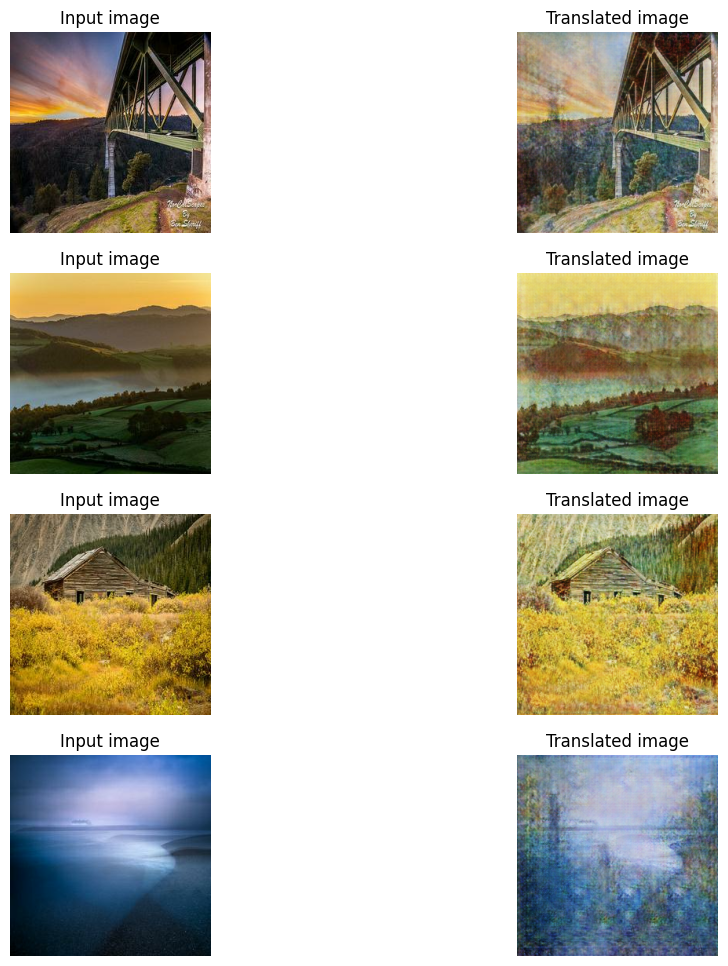

1759/1759 [==============================] - 537s 306ms/step - monet_gen_loss: 2.3583 - photo_gen_loss: 2.3937 - monet_disc_loss: 0.5911 - photo_disc_loss: 0.5927
Epoch 10/20
1759/1759 [==============================] - ETA: 0s - monet_gen_loss: 2.3866 - photo_gen_loss: 2.3882 - monet_disc_loss: 0.5824 - photo_disc_loss: 0.5918

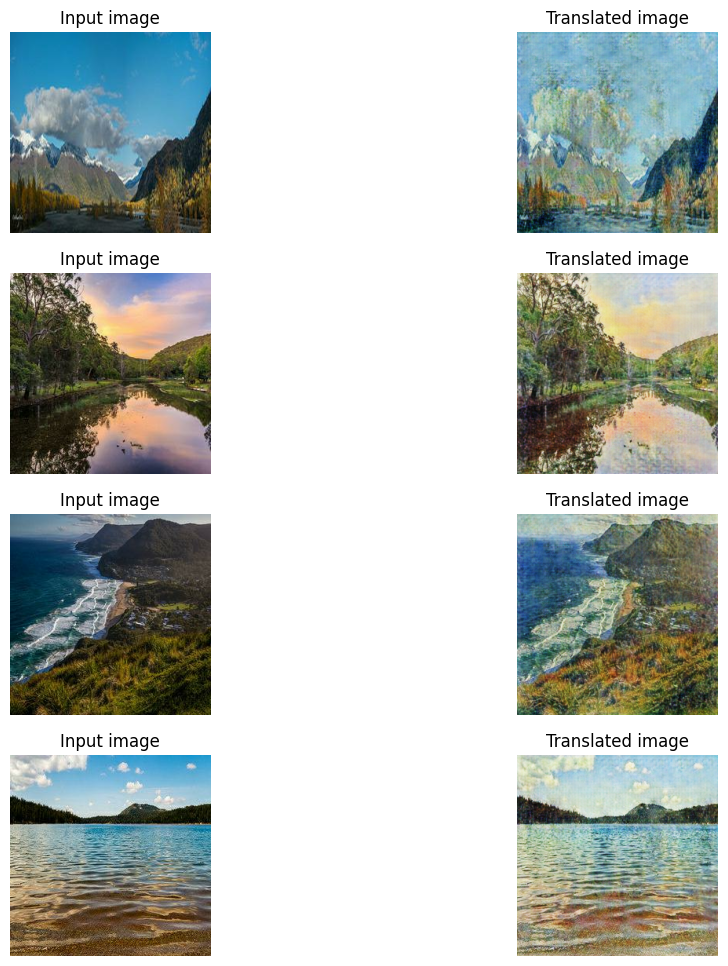

1759/1759 [==============================] - 538s 306ms/step - monet_gen_loss: 2.3866 - photo_gen_loss: 2.3880 - monet_disc_loss: 0.5824 - photo_disc_loss: 0.5919
Epoch 11/20
1759/1759 [==============================] - ETA: 0s - monet_gen_loss: 2.4270 - photo_gen_loss: 2.3841 - monet_disc_loss: 0.5707 - photo_disc_loss: 0.5934

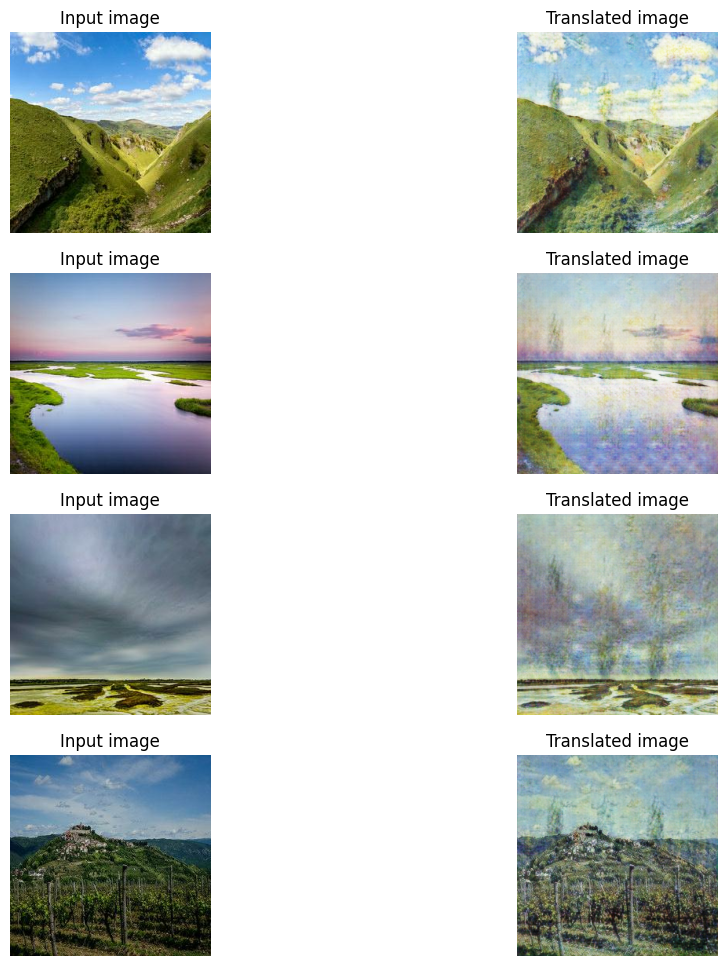

1759/1759 [==============================] - 539s 306ms/step - monet_gen_loss: 2.4269 - photo_gen_loss: 2.3842 - monet_disc_loss: 0.5707 - photo_disc_loss: 0.5933
Epoch 12/20
1759/1759 [==============================] - ETA: 0s - monet_gen_loss: 2.4685 - photo_gen_loss: 2.3874 - monet_disc_loss: 0.5598 - photo_disc_loss: 0.5903

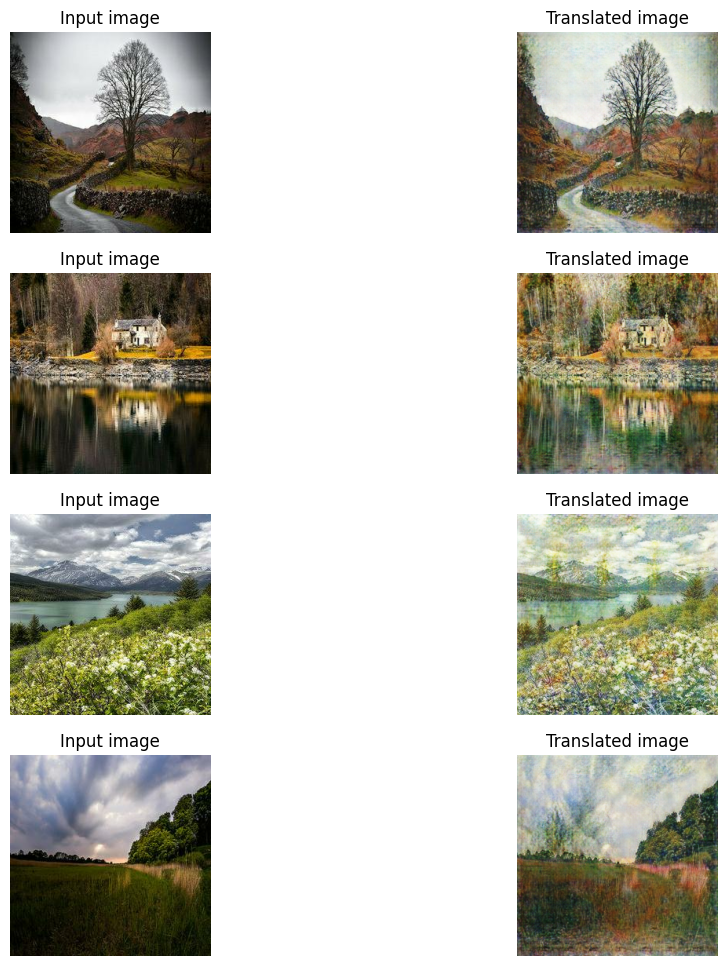

1759/1759 [==============================] - 539s 307ms/step - monet_gen_loss: 2.4684 - photo_gen_loss: 2.3877 - monet_disc_loss: 0.5598 - photo_disc_loss: 0.5903
Epoch 13/20
1229/1759 [===================>..........] - ETA: 2:41 - monet_gen_loss: 2.5100 - photo_gen_loss: 2.4023 - monet_disc_loss: 0.5505 - photo_disc_loss: 0.5864

KeyboardInterrupt: 

In [21]:
history = cycle_gan_model.fit(
    full_dataset,
    epochs=EPOCHS_NUM,
    steps_per_epoch=len(photo_image_files)//BATCH_SIZE,
    callbacks=[plotter, model_checkpoint_callback]
)


In [ ]:
print(history)